In [1]:
%matplotlib inline
%load_ext memory_profiler

import pandas as pd
import os
import glob
import pickle
import phate
import scprep
import meld
import graphtools as gt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import datetime
import scanpy as sc
from sklearn.decomposition import PCA
from py_pcha import PCHA
import wot
import math
import pegasus as pg
from scipy import sparse
import sys
sys.path.append('/home/ngr4/project/scripts/')
import utils

# settings
plt.rc('font', size = 9)
plt.rc('font', family='sans serif')
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=False
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=9)
plt.rcParams['savefig.dpi']=600
sc.settings.verbosity=2
sc._settings.ScanpyConfig.n_jobs=-1
sns.set_style("ticks")



In [2]:
from scipy.sparse.csgraph import minimum_spanning_tree, shortest_path
from scipy.spatial.distance import cdist, pdist, squareform
from scipy.ndimage import gaussian_filter1d
from statsmodels.nonparametric.smoothers_lowess import lowess


In [3]:
pdfp = '/home/ngr4/project/scnd/data/processed'
pfp = '/home/ngr4/project/scnd/results/'

%memit adata = utils.load_adata(os.path.join(pdfp,'mouse_200614.h5ad'))

loaded @200701.20:17:30
took 15.60-s to load data
peak memory: 10892.47 MiB, increment: 10600.42 MiB


In [4]:
# aesthetics
cmap_wt = {v:sns.cubehelix_palette(5, start=0.5, rot=-0.75)[i] for i,v in enumerate(['5wk', '12wk', '18wk', '24wk', '30wk'])}
cmap_mut = {v:sns.cubehelix_palette(5)[i] for i,v in enumerate(['5wk', '12wk', '18wk', '24wk', '30wk'])}

computing PCA
    with n_comps=50
    finished (0:00:26)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:28)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4831 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 16.52 seconds.
  Calculated landmark operator in 18.19 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.43 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.29 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 26.37 seconds.
Calculated PHATE in 46.30 seconds.


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4764 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 18.67 seconds.
  Calculated landmark operator in 20.39 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.44 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.43 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 39.23 seconds.
Calculated PHATE in 61.50 seconds.
Calculating PHATE...
  Running PHATE on 4831 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 9.05 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.96 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 12.27 seconds.
  Calculating landmark

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4090 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.26 seconds.
    Calculating KMeans...
    Calculated KMeans in 18.08 seconds.
  Calculated landmark operator in 19.72 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.41 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.43 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 17.17 seconds.
Calculated PHATE in 38.74 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4108 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


    Calculated SVD in 0.26 seconds.
    Calculating KMeans...
    Calculated KMeans in 20.42 seconds.
  Calculated landmark operator in 22.08 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.42 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.50 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 23.64 seconds.
Calculated PHATE in 47.66 seconds.
Calculating PHATE...
  Running PHATE on 4090 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 7.89 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.17 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 10.27 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.64 seconds.
    Calculating KMeans...
    Calculated KMeans in 19.86 seconds.
  Calculated landmark operator in 21.96 seconds.
  

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 5115 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.34 seconds.
    Calculating KMeans...
    Calculated KMeans in 14.36 seconds.
  Calculated landmark operator in 16.06 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.40 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.43 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 37.33 seconds.
Calculated PHATE in 55.24 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4260 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


    Calculated SVD in 0.27 seconds.
    Calculating KMeans...
    Calculated KMeans in 20.91 seconds.
  Calculated landmark operator in 22.59 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.43 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.51 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 36.55 seconds.
Calculated PHATE in 61.10 seconds.
Calculating PHATE...
  Running PHATE on 5115 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 8.71 seconds.
    Calculating KNN search...
    Calculated KNN search in 3.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 12.03 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.96 seconds.
    Calculating KMeans...
    Calculated KMeans in 18.57 seconds.
  Calculated landmark operator in 21.06 seconds.
  

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


    Calculated SVD in 0.13 seconds.
    Calculating KMeans...
    Calculated KMeans in 8.91 seconds.
  Calculated landmark operator in 10.33 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.36 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.50 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 7.24 seconds.
Calculated PHATE in 19.45 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 919 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 0.18 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.05 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.73 seconds.
Calculated PHATE in 3.97 seconds.
Calculating PHATE...
  Running PHATE on 2235 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 6.32 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.70 seconds.
    Calculating affinities...
    Calculated affinities in 0.10 seconds.
  Calculated graph and diffusion operator in 7.13 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.24 seconds.
    Calculating KMeans...
    Calculated KMeans in 12.70 seconds.
  Calculated landmark operator in 14.30 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.39 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.43 seconds.
  Calculating metric MDS...
 

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 6892 cells.
  Calculating graph and diffusion operator...
  Calculated graph and diffusion operator in 0.01 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.47 seconds.
    Calculating KMeans...
    Calculated KMeans in 23.30 seconds.
  Calculated landmark operator in 25.23 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.42 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.51 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 16.76 seconds.
Calculated PHATE in 43.94 seconds.


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 6817 cells.
  Calculating graph and diffusion operator...
  Calculated graph and diffusion operator in 0.01 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.48 seconds.
    Calculating KMeans...
    Calculated KMeans in 16.19 seconds.
  Calculated landmark operator in 18.16 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.44 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.49 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 13.59 seconds.
Calculated PHATE in 33.69 seconds.
Calculating PHATE...
  Running PHATE on 6892 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 15.52 seconds.
    Calculating KNN search...
    Calculated KNN search in 5.72 seconds.
    Calculating affinities...
    Calculated affinities in 0.31 seconds.
  Calculated graph and

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 0.75 seconds.
Calculated PHATE in 0.83 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 500 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...
  Calculated optimal t in 0.05 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 0.53 seconds.
Calculated PHATE in 0.60 seconds.
Calculating PHATE...
  Running PHATE on 528 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.04 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 1.13 seconds.
  Calculating optimal t...
  Calculated optimal t in 0.06 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...
  Calculated metric MDS in 0.08 seconds.
Calculated PHATE in 1.27 seconds.
Calculating PHATE...
  Running PHATE on 500 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.00 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and 

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 1.46 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.49 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 16.44 seconds.
Calculated PHATE in 18.41 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 1917 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 1.30 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.39 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 10.71 seconds.
Calculated PHATE in 12.41 seconds.
Calculating PHATE...
  Running PHATE on 1982 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 4.18 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.55 seconds.
    Calculating affinities...
    Calculated affinities in 0.08 seconds.
  Calculated graph and diffusion operator in 4.82 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.45 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.36 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.59 seconds.
Calculated PHATE in 10.24 seconds.
Calculating PHATE...
  Running PHATE on 1917 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PC

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 0.51 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.12 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.25 seconds.
Calculated PHATE in 3.89 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 1662 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 0.88 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.22 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 17.37 seconds.
Calculated PHATE in 18.48 seconds.
Calculating PHATE...
  Running PHATE on 1371 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 2.71 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.27 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 3.05 seconds.
  Calculating optimal t...
  Calculated optimal t in 0.51 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.14 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.04 seconds.
Calculated PHATE in 4.75 seconds.
Calculating PHATE...
  Running PHATE on 1662 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 0.85 seconds.
Calculated PHATE in 1.00 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 748 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...
  Calculated optimal t in 0.11 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.03 seconds.
  Calculating metric MDS...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 1.10 seconds.
Calculated PHATE in 1.24 seconds.
Calculating PHATE...
  Running PHATE on 754 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 2.14 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.10 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 2.27 seconds.
  Calculating optimal t...
  Calculated optimal t in 0.12 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.02 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.25 seconds.
Calculated PHATE in 2.67 seconds.
Calculating PHATE...
  Running PHATE on 748 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 2.02 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.10 seconds.
    Calculating affinities...
    Calculated a

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 0.31 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.09 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 4.34 seconds.
Calculated PHATE in 4.75 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 1022 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 0.24 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.08 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.27 seconds.
Calculated PHATE in 2.59 seconds.
Calculating PHATE...
  Running PHATE on 1152 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 3.71 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.20 seconds.
    Calculating affinities...
    Calculated affinities in 0.07 seconds.
  Calculated graph and diffusion operator in 3.99 seconds.
  Calculating optimal t...
  Calculated optimal t in 0.31 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.09 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.75 seconds.
Calculated PHATE in 5.15 seconds.
Calculating PHATE...
  Running PHATE on 1022 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA..

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 0.26 seconds.
Calculated PHATE in 0.32 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 434 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...
  Calculated optimal t in 0.04 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 0.20 seconds.
Calculated PHATE in 0.26 seconds.
Calculating PHATE...
  Running PHATE on 458 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.59 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 1.66 seconds.
  Calculating optimal t...
  Calculated optimal t in 0.04 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...
  Calculated metric MDS in 0.09 seconds.
Calculated PHATE in 1.80 seconds.
Calculating PHATE...
  Running PHATE on 434 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.57 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and 

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 0.61 seconds.
Calculated PHATE in 0.70 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 430 cells.
  Calculating graph and diffusion operator...
  Calculating optimal t...
  Calculated optimal t in 0.04 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated metric MDS in 0.18 seconds.
Calculated PHATE in 0.23 seconds.
Calculating PHATE...
  Running PHATE on 577 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.31 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 1.41 seconds.
  Calculating optimal t...
  Calculated optimal t in 0.07 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.01 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.15 seconds.
Calculated PHATE in 1.64 seconds.
Calculating PHATE...
  Running PHATE on 430 cells and 26374 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.03 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated a

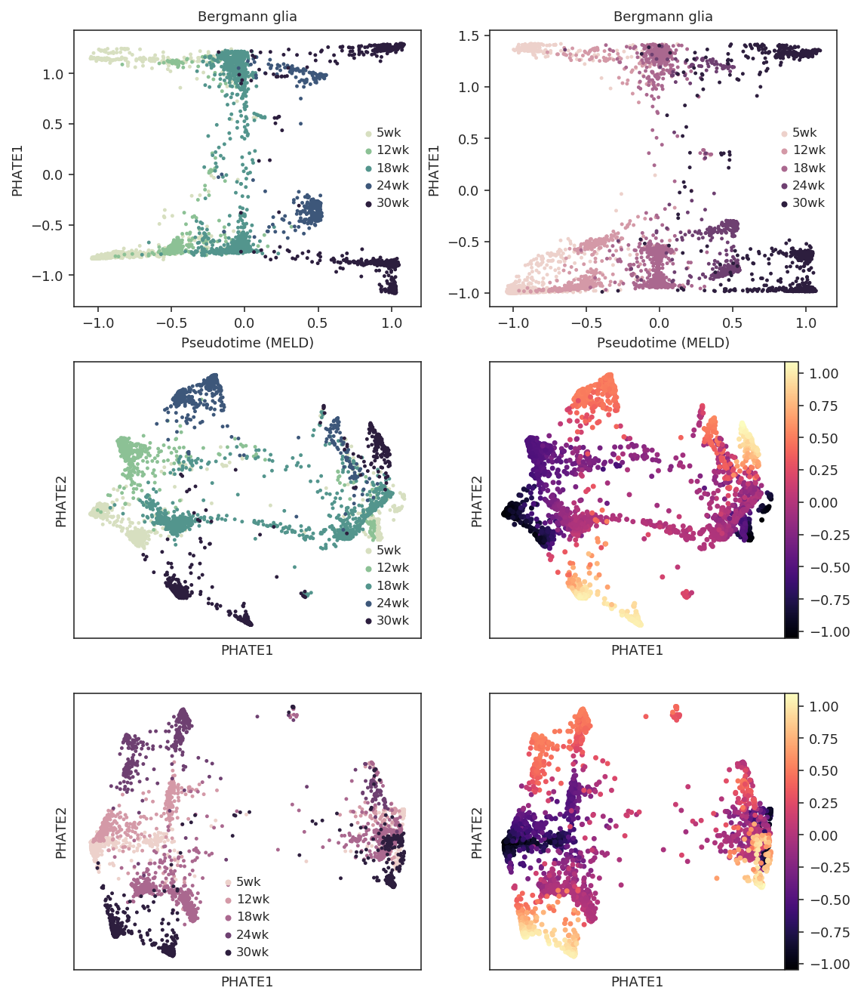

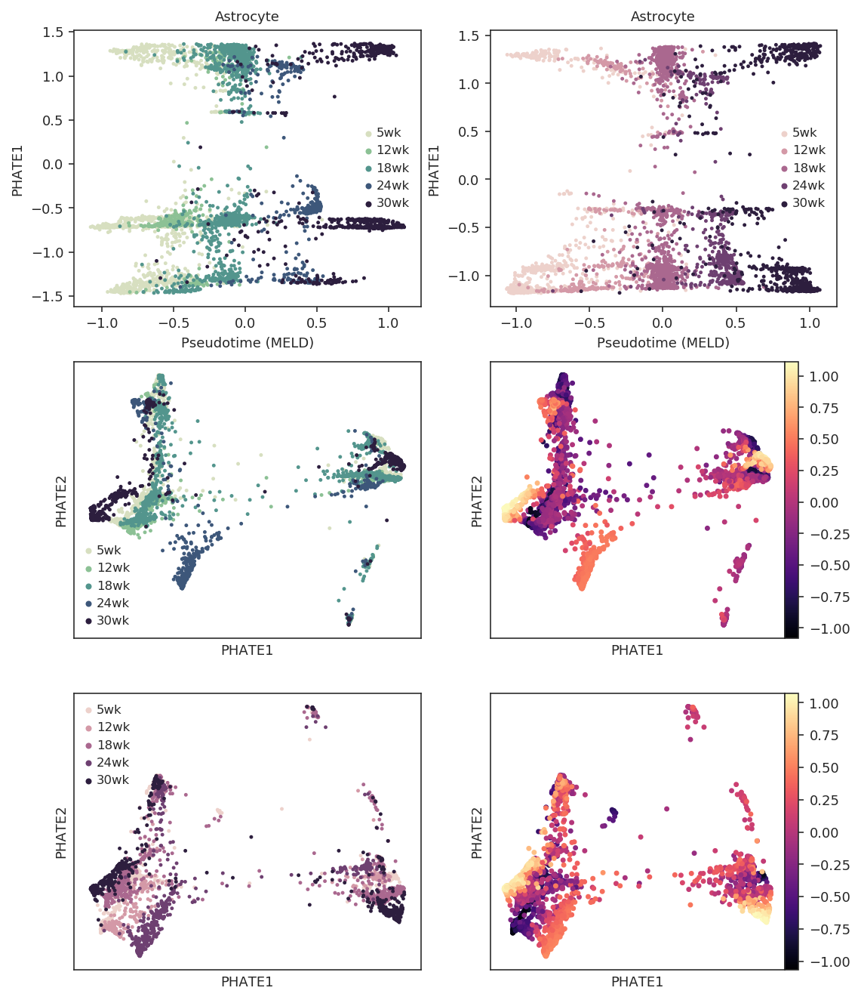

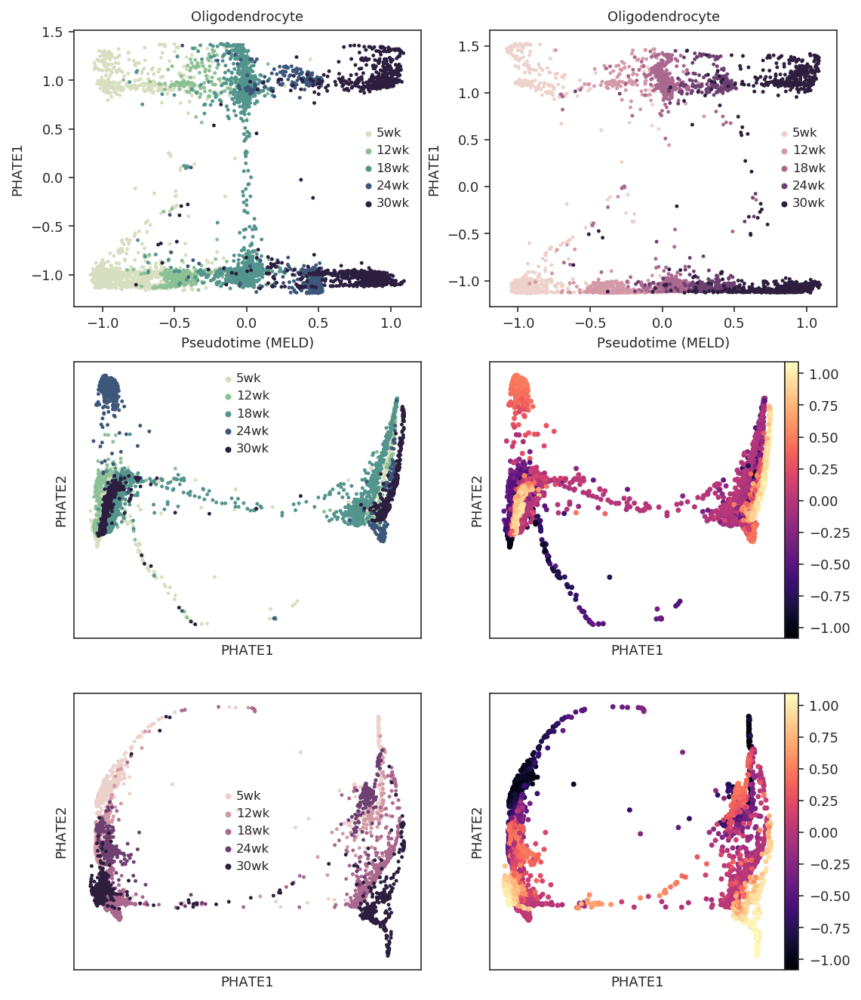

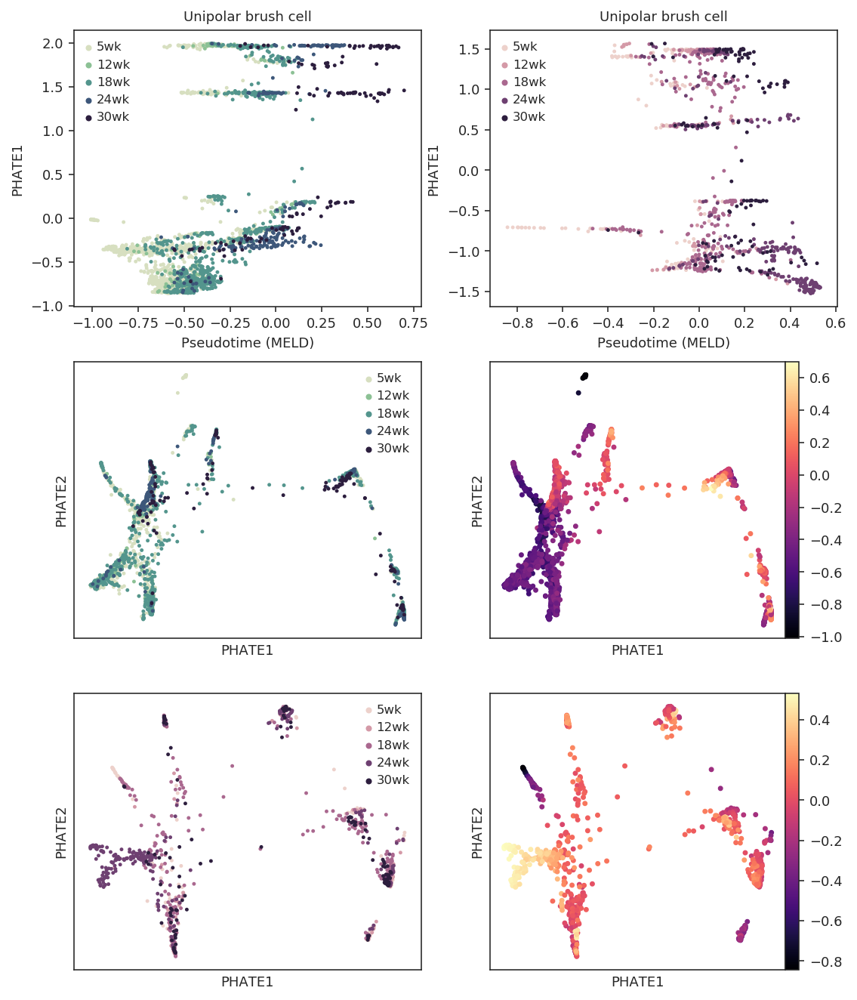

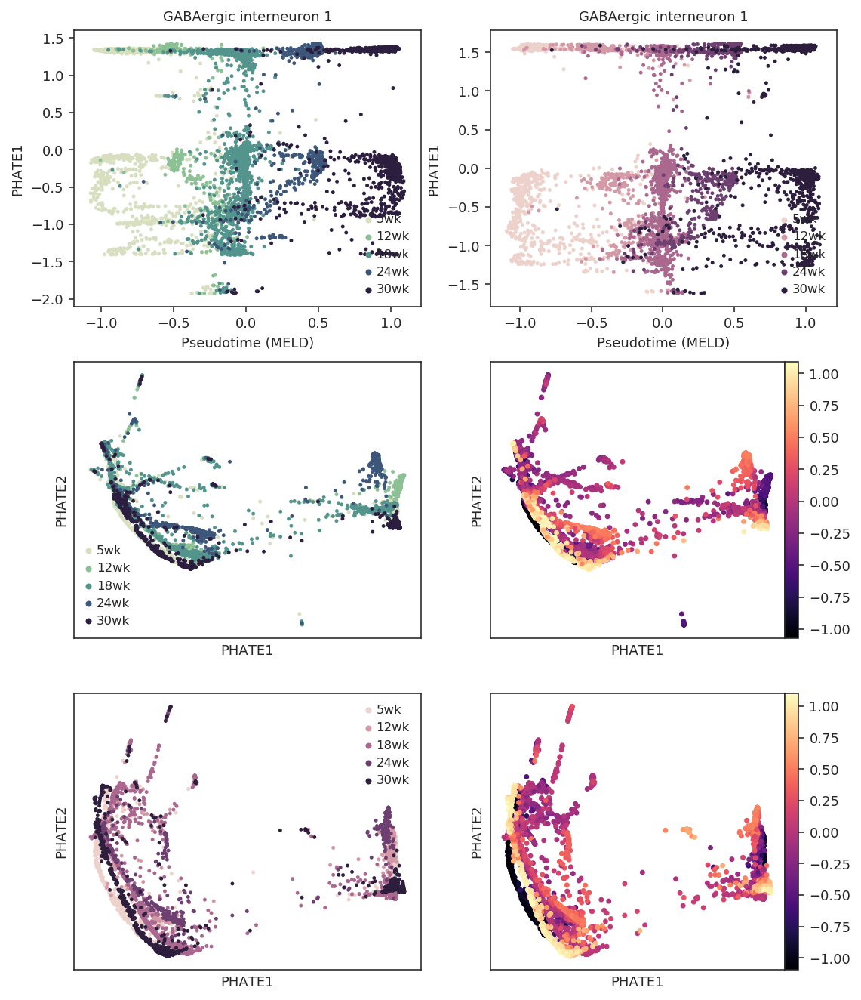

...

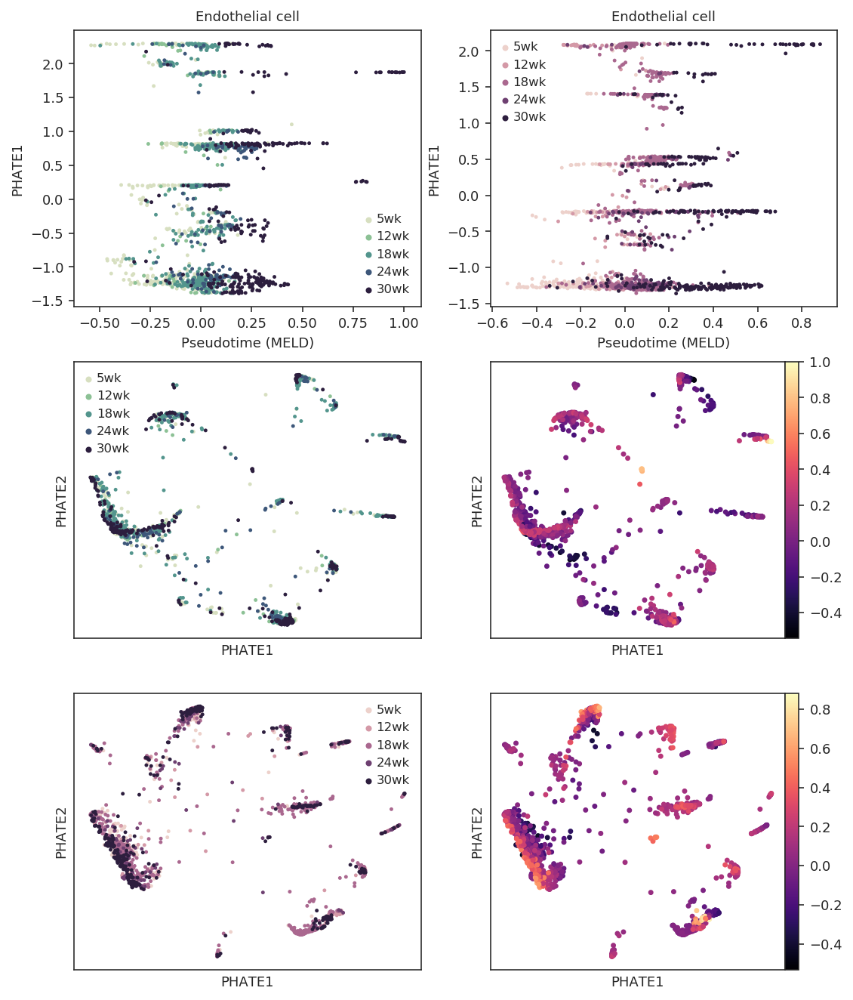

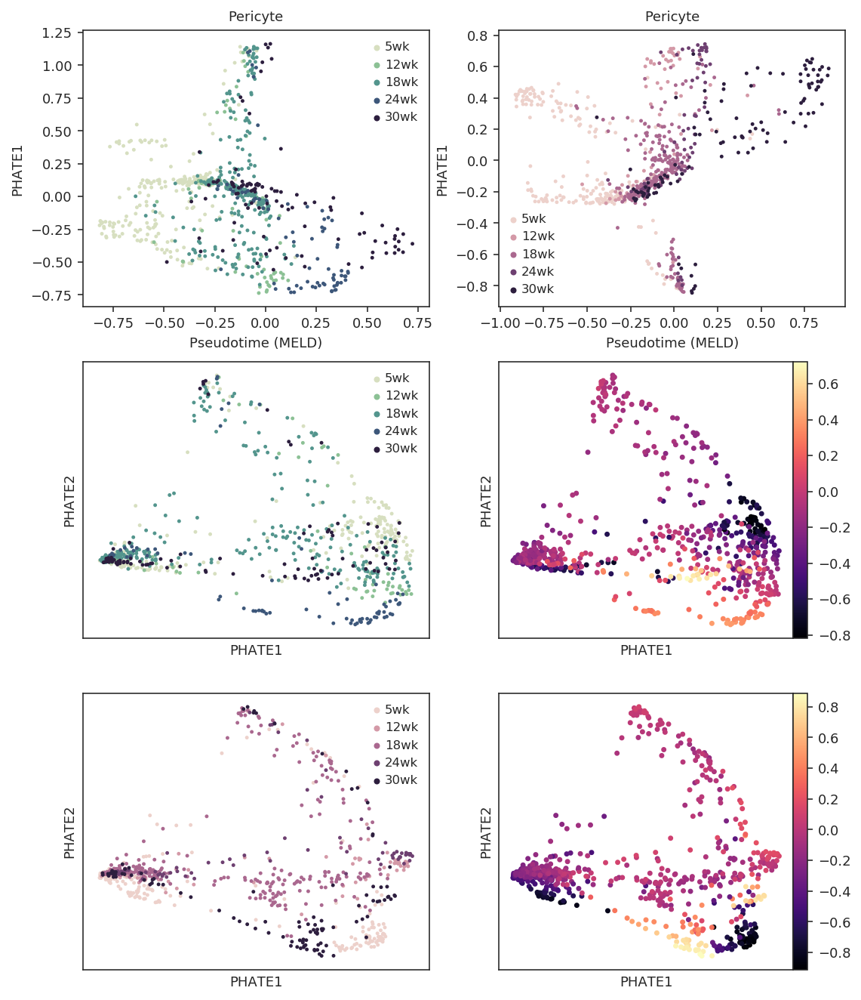

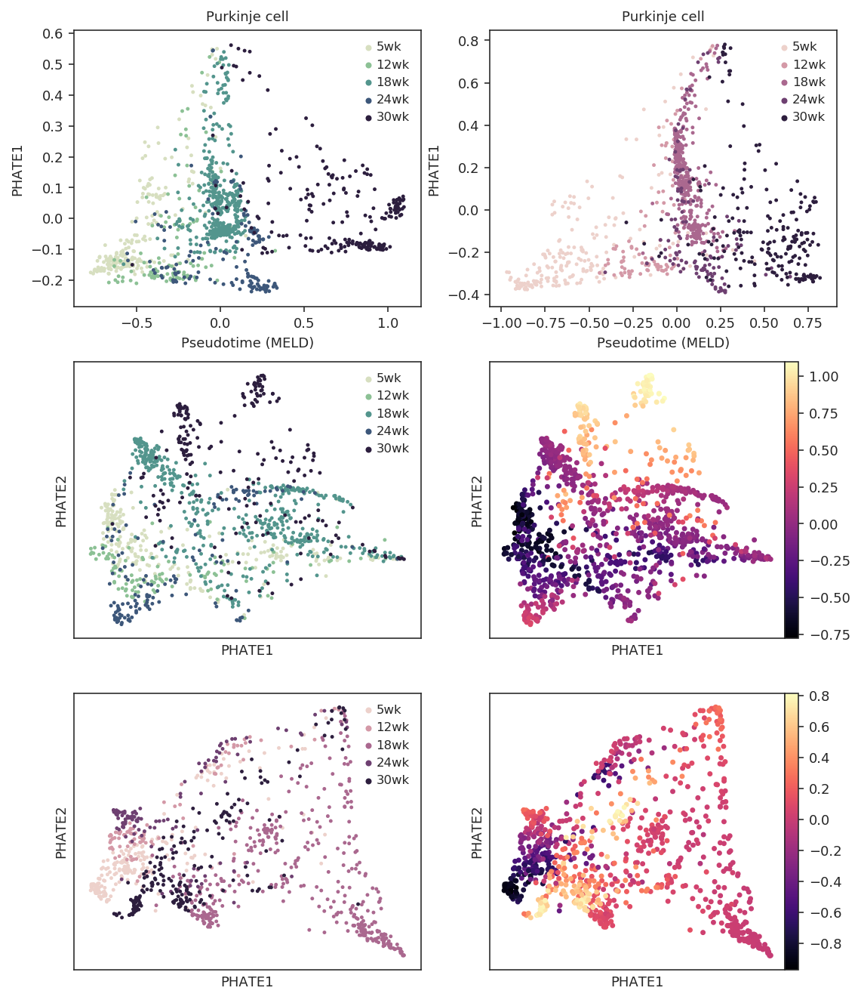

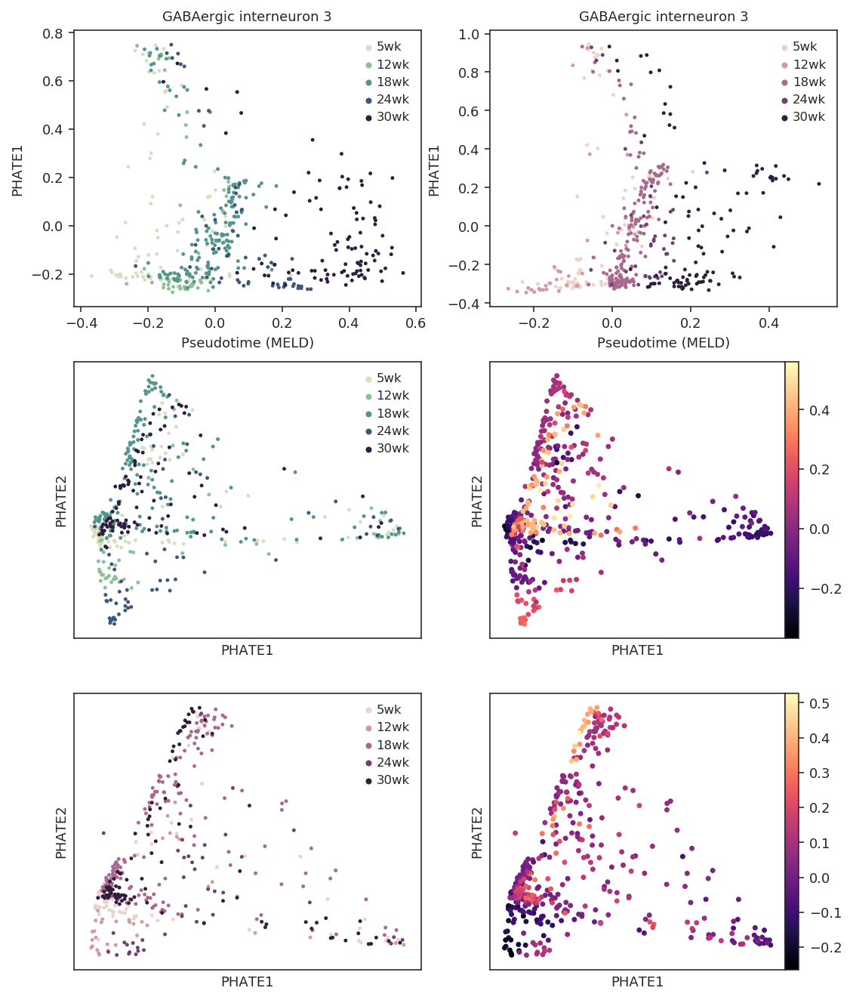

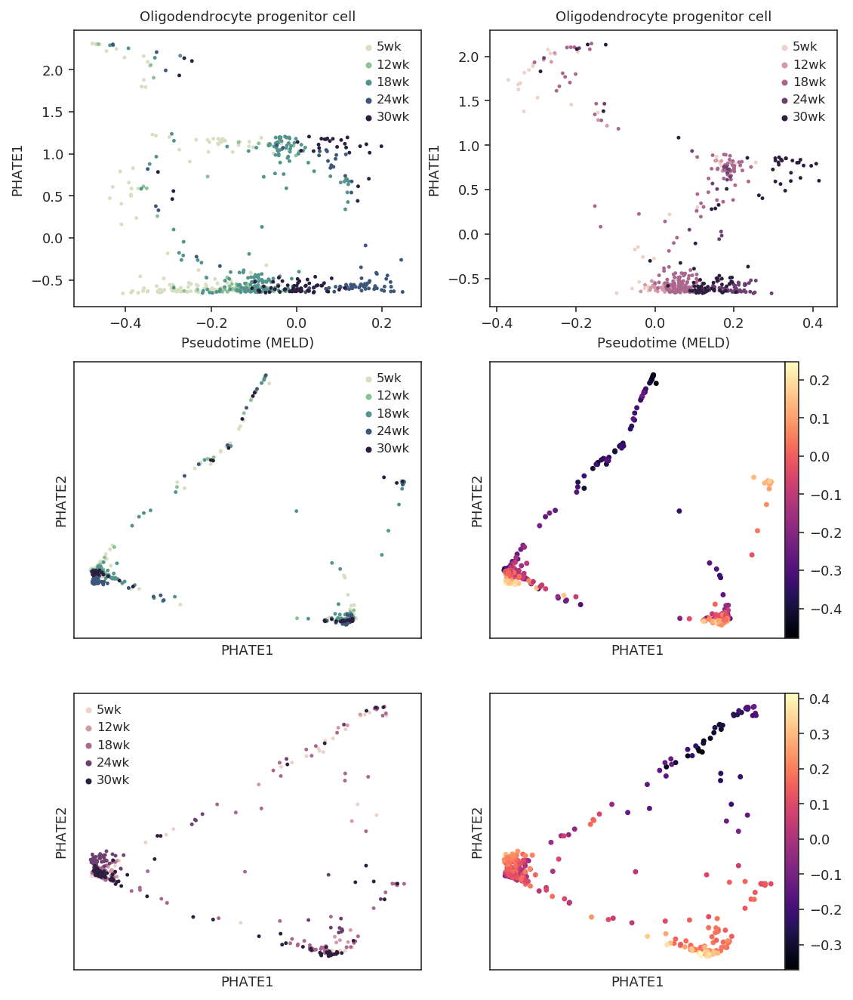

In [42]:
for ctype in [i for i in adata.obs['ctype'].unique() if 'Granule' not in i]:
    wt = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='WT')]
    mut = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='SCA1')]

    sc.pp.pca(wt)
    sc.pp.neighbors(wt, n_pcs=50)
    sc.pp.pca(mut)
    sc.pp.neighbors(mut, n_pcs=50)
    
    wt = utils.adata_phate(wt)
    mut = utils.adata_phate(mut)

    # MELD
    G = gt.Graph(data=wt.obsp['connectivities']+sparse.diags([1]*wt.shape[0],format='csr'),
                 precomputed='adjacency',
                 use_pygsp=True)
    G.knn_max = None
    wt.obs['res_t']=-1
    wt.obs.loc[wt.obs['timepoint']=='12wk', 'res_t'] = -0.5
    wt.obs.loc[wt.obs['timepoint']=='18wk', 'res_t'] = 0
    wt.obs.loc[wt.obs['timepoint']=='24wk', 'res_t'] = 0.5
    wt.obs.loc[wt.obs['timepoint']=='30wk', 'res_t'] = 1
    wt.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=wt.obs['res_t'])
    G = gt.Graph(data=mut.obsp['connectivities']+sparse.diags([1]*mut.shape[0],format='csr'),
             precomputed='adjacency',
             use_pygsp=True)
    G.knn_max = None
    mut.obs['res_t']=-1
    mut.obs.loc[mut.obs['timepoint']=='12wk', 'res_t'] = -0.5
    mut.obs.loc[mut.obs['timepoint']=='18wk', 'res_t'] = 0
    mut.obs.loc[mut.obs['timepoint']=='24wk', 'res_t'] = 0.5
    mut.obs.loc[mut.obs['timepoint']=='30wk', 'res_t'] = 1
    mut.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=mut.obs['res_t'])


    # 1d phate
    wt_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(wt.X)
    mut_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(mut.X)

    # plots 
    fig, ax = plt.subplots(3,2, figsize=(9,11))
    sns.scatterplot(
        x=wt.obsm['X_phate'][:,0],
        y=wt.obsm['X_phate'][:,1],
        hue=wt.obs['timepoint'].to_list(),
        palette=cmap_wt,
        ax=ax[1,0],
        linewidth=0,
        s=6,
        rasterized=True)
    ax[1,0].set_xlabel('PHATE1')
    ax[1,0].set_ylabel('PHATE2')
    ax[1,0].set_xticks([])
    ax[1,0].set_yticks([])
    
    p = ax[1,1].scatter(wt.obsm['X_phate'][:,0],
                        wt.obsm['X_phate'][:,1],
                        c=wt.obs['ees_t'],
                        cmap='magma', s=6,
                        rasterized=True)
    fig.colorbar(p, pad=0, ax=ax[1,1])
    ax[1,1].set_xticks([])
    ax[1,1].set_yticks([])
    ax[1,1].set_xlabel('PHATE1')
    ax[1,1].set_ylabel('PHATE2')
    
    sns.scatterplot(
        x=mut.obsm['X_phate'][:,0],
        y=mut.obsm['X_phate'][:,1],
        hue=mut.obs['timepoint'].to_list(),
        palette=cmap_mut,
        ax=ax[2,0],
        linewidth=0,
        s=6,
        rasterized=True)
    ax[2,0].set_xlabel('PHATE1')
    ax[2,0].set_ylabel('PHATE2')
    ax[2,0].set_xticks([])
    ax[2,0].set_yticks([])
    
    p = ax[2,1].scatter(mut.obsm['X_phate'][:,0],
                        mut.obsm['X_phate'][:,1],
                        c=mut.obs['ees_t'],
                        cmap='magma', s=6, 
                        rasterized=True)
    fig.colorbar(p, pad=0, ax=ax[2,1])
    ax[2,1].set_xticks([])
    ax[2,1].set_yticks([])
    ax[2,1].set_xlabel('PHATE1')
    ax[2,1].set_ylabel('PHATE2')

    sns.scatterplot(
        x=wt.obs['ees_t'].to_list(),
        y=wt_phate1d.flatten(),
        hue=wt.obs['timepoint'].to_list(),
        palette=cmap_wt,
        ax=ax[0,0],
        linewidth=0,
        s=6, 
        rasterized=True)
    ax[0,0].set_xlabel('Pseudotime (MELD)')
    ax[0,0].set_ylabel('PHATE1')
    ax[0,0].set_title(ctype)
    if False:
        # plot smooth line
        z = lowess(phate_1d.flatten(), wt.obs['ees_t'].to_numpy())
        ax[1].plot(z[:,0], z[:,1], 'k-', lw=2)
        
    sns.scatterplot(
        x=mut.obs['ees_t'].to_list(),
        y=mut_phate1d.flatten(),
        hue=mut.obs['timepoint'].to_list(),
        palette=cmap_mut,
        ax=ax[0,1],
        linewidth=0,
        s=6, 
        rasterized=True)
    ax[0,1].set_xlabel('Pseudotime (MELD)')
    ax[0,1].set_ylabel('PHATE1')
    ax[0,1].set_title(ctype)
    if False:
        # plot smooth line
        z = lowess(phate_1d.flatten(), wt.obs['ees_t'].to_numpy())
        ax[1].plot(z[:,0], z[:,1], 'k-', lw=2)
    
    if True:
        fig.savefig(os.path.join(pfp, 'pseudotime_{}.pdf'.format(ctype)), bbox_inches='tight', dpi=600)
        
    del wt, mut
        
        

computing PCA
    with n_comps=50
    finished (0:00:26)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:28)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4831 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 15.77 seconds.
  Calculated landmark operator in 17.46 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.39 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.28 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 26.56 seconds.
Calculated PHATE in 45.70 seconds.


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4764 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 17.71 seconds.
  Calculated landmark operator in 19.43 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.38 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.41 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 39.05 seconds.
Calculated PHATE in 60.29 seconds.
computing PCA
    with n_comps=50
    finished (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:14)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4090 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.27 seconds.
    Calculating KMeans...
    Calculated KMeans in 17.30 seconds.
  Calculated landmark operator in 18.94 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.35 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.41 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 16.95 seconds.
Calculated PHATE in 37.67 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 4108 cells.
  Calculating graph and diffusion operator...
  Calculating landmark operator...
    Calculating SVD...


/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


    Calculated SVD in 0.26 seconds.
    Calculating KMeans...
    Calculated KMeans in 19.27 seconds.
  Calculated landmark operator in 20.92 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.36 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.49 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 23.42 seconds.
Calculated PHATE in 46.20 seconds.
computing PCA
    with n_comps=50
    finished (0:00:15)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing PCA
    with n_comps=50


KeyboardInterrupt: 

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x2b1525ced200> (for post_execute):


KeyboardInterrupt: 

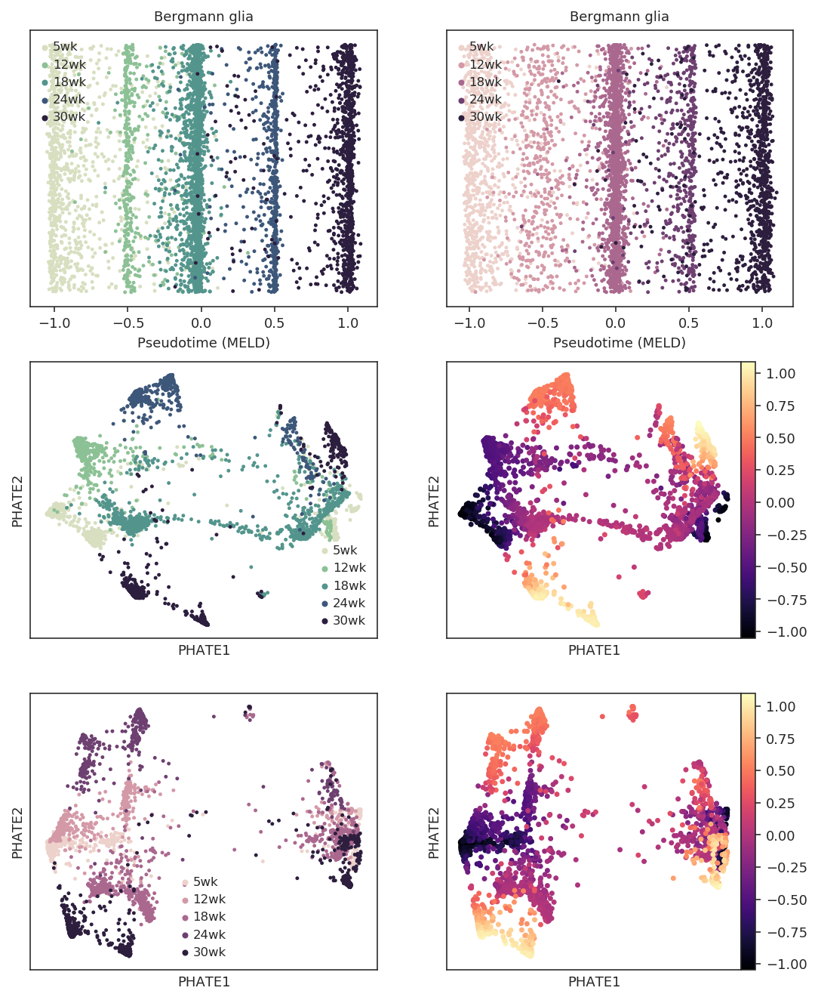

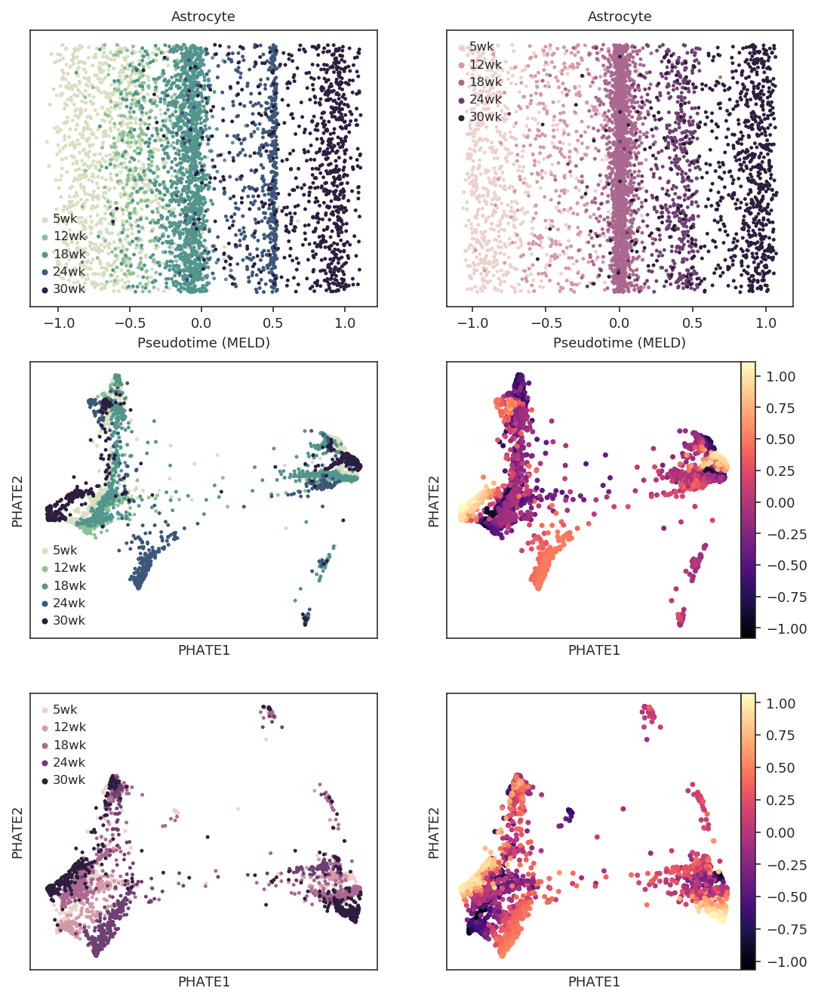

In [50]:
for ctype in [i for i in adata.obs['ctype'].unique() if 'Granule' not in i]:
    wt = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='WT')]
    mut = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='SCA1')]

    sc.pp.pca(wt)
    sc.pp.neighbors(wt, n_pcs=50)
    sc.pp.pca(mut)
    sc.pp.neighbors(mut, n_pcs=50)
    
    if True:
        wt = utils.adata_phate(wt)
        mut = utils.adata_phate(mut)

    # MELD
    G = gt.Graph(data=wt.obsp['connectivities']+sparse.diags([1]*wt.shape[0],format='csr'),
                 precomputed='adjacency',
                 use_pygsp=True)
    G.knn_max = None
    wt.obs['res_t']=-1
    wt.obs.loc[wt.obs['timepoint']=='12wk', 'res_t'] = -0.5
    wt.obs.loc[wt.obs['timepoint']=='18wk', 'res_t'] = 0
    wt.obs.loc[wt.obs['timepoint']=='24wk', 'res_t'] = 0.5
    wt.obs.loc[wt.obs['timepoint']=='30wk', 'res_t'] = 1
    wt.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=wt.obs['res_t'])
    G = gt.Graph(data=mut.obsp['connectivities']+sparse.diags([1]*mut.shape[0],format='csr'),
             precomputed='adjacency',
             use_pygsp=True)
    G.knn_max = None
    mut.obs['res_t']=-1
    mut.obs.loc[mut.obs['timepoint']=='12wk', 'res_t'] = -0.5
    mut.obs.loc[mut.obs['timepoint']=='18wk', 'res_t'] = 0
    mut.obs.loc[mut.obs['timepoint']=='24wk', 'res_t'] = 0.5
    mut.obs.loc[mut.obs['timepoint']=='30wk', 'res_t'] = 1
    mut.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=mut.obs['res_t'])

    if False:
        # 1d phate
        wt_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(wt.X)
        mut_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(mut.X)

    # plots 
    fig, ax = plt.subplots(3,2, figsize=(9,11))
    sns.scatterplot(
        x=wt.obsm['X_phate'][:,0],
        y=wt.obsm['X_phate'][:,1],
        hue=wt.obs['timepoint'].to_list(),
        palette=cmap_wt,
        ax=ax[1,0],
        linewidth=0,
        s=6,
        rasterized=True)
    ax[1,0].set_xlabel('PHATE1')
    ax[1,0].set_ylabel('PHATE2')
    ax[1,0].set_xticks([])
    ax[1,0].set_yticks([])
    
    p = ax[1,1].scatter(wt.obsm['X_phate'][:,0],
                        wt.obsm['X_phate'][:,1],
                        c=wt.obs['ees_t'],
                        cmap='magma', s=6,
                        rasterized=True)
    fig.colorbar(p, pad=0, ax=ax[1,1])
    ax[1,1].set_xticks([])
    ax[1,1].set_yticks([])
    ax[1,1].set_xlabel('PHATE1')
    ax[1,1].set_ylabel('PHATE2')
    
    sns.scatterplot(
        x=mut.obsm['X_phate'][:,0],
        y=mut.obsm['X_phate'][:,1],
        hue=mut.obs['timepoint'].to_list(),
        palette=cmap_mut,
        ax=ax[2,0],
        linewidth=0,
        s=6,
        rasterized=True)
    ax[2,0].set_xlabel('PHATE1')
    ax[2,0].set_ylabel('PHATE2')
    ax[2,0].set_xticks([])
    ax[2,0].set_yticks([])
    
    p = ax[2,1].scatter(mut.obsm['X_phate'][:,0],
                        mut.obsm['X_phate'][:,1],
                        c=mut.obs['ees_t'],
                        cmap='magma', s=6, 
                        rasterized=True)
    fig.colorbar(p, pad=0, ax=ax[2,1])
    ax[2,1].set_xticks([])
    ax[2,1].set_yticks([])
    ax[2,1].set_xlabel('PHATE1')
    ax[2,1].set_ylabel('PHATE2')

    sns.scatterplot(
        x=wt.obs['ees_t'].to_list(),
        y=np.random.uniform(size=wt.shape[0]),
        hue=wt.obs['timepoint'].to_list(),
        palette=cmap_wt,
        ax=ax[0,0],
        linewidth=0,
        s=6, 
        rasterized=True)
    ax[0,0].set_xlabel('Pseudotime (MELD)')
    ax[0,0].set_yticks([])
#     ax[0,0].set_ylabel('rand1')
    ax[0,0].set_title(ctype)
    if False:
        # plot smooth line
        z = lowess(phate_1d.flatten(), wt.obs['ees_t'].to_numpy())
        ax[1].plot(z[:,0], z[:,1], 'k-', lw=2)
        
    sns.scatterplot(
        x=mut.obs['ees_t'].to_list(),
        y=np.random.uniform(size=mut.shape[0]),
        hue=mut.obs['timepoint'].to_list(),
        palette=cmap_mut,
        ax=ax[0,1],
        linewidth=0,
        s=6, 
        rasterized=True)
    ax[0,1].set_xlabel('Pseudotime (MELD)')
#     ax[0,1].set_ylabel('PHATE1')
    ax[0,1].set_yticks([])
    ax[0,1].set_title(ctype)
    if False:
        # plot smooth line
        z = lowess(phate_1d.flatten(), wt.obs['ees_t'].to_numpy())
        ax[1].plot(z[:,0], z[:,1], 'k-', lw=2)
    
    if True:
        fig.savefig(os.path.join(pfp, 'pseudotime_{}_rand.pdf'.format(ctype)), bbox_inches='tight', dpi=600)
        
    del wt, mut
        
        

## 1D plots 

In [5]:
# aesthetics
cmap_wt = {v:sns.cubehelix_palette(8, start=0.5, rot=-0.75)[i+1] for i,v in enumerate(['5wk', '12wk', '18wk', '24wk', '30wk'])}
cmap_mut = {v:sns.cubehelix_palette(8)[i+1] for i,v in enumerate(['5wk', '12wk', '18wk', '24wk', '30wk'])}

cmap_gt = {}
for k in cmap_wt.keys():
    cmap_gt['WT_{}'.format(k)] = cmap_wt[k]
    cmap_gt['SCA1_{}'.format(k)] = cmap_mut[k]

computing PCA
    with n_comps=50
    finished (0:02:53)
computing neighbors
    using 'X_pca' with n_pcs = 50


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../conda_envs/rnavel/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../con

    finished (0:00:57)
computing PCA
    with n_comps=50
    finished (0:02:28)
computing neighbors
    using 'X_pca' with n_pcs = 50


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../conda_envs/rnavel/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished (0:00:53)


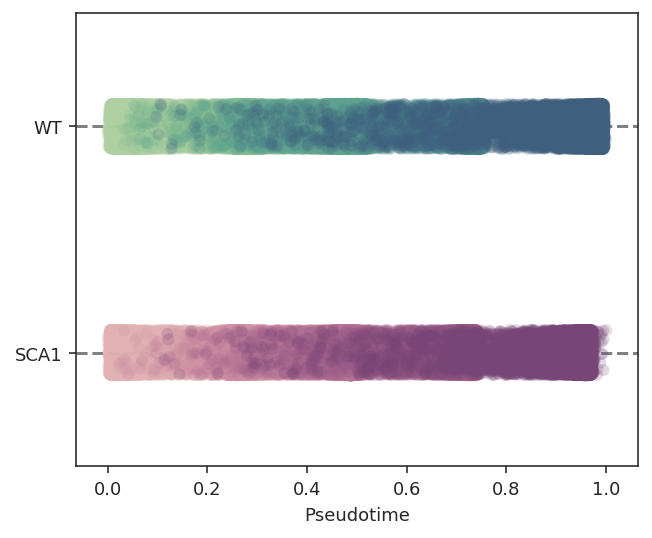

In [6]:
for ctype in ['Granule cell']:#[i for i in adata.obs['ctype'].unique() if 'Granule' not in i]:
    wt = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='WT')]
    mut = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='SCA1')]

    sc.pp.pca(wt)
    sc.pp.neighbors(wt, n_pcs=50)
    sc.pp.pca(mut)
    sc.pp.neighbors(mut, n_pcs=50)
    
    if False:
        wt = utils.adata_phate(wt)
        mut = utils.adata_phate(mut)

    # MELD
    G = gt.Graph(data=wt.obsp['connectivities']+sparse.diags([1]*wt.shape[0],format='csr'),
                 precomputed='adjacency',
                 use_pygsp=True)
    G.knn_max = None
    wt.obs['res_t']=-1
    wt.obs.loc[wt.obs['timepoint']=='12wk', 'res_t'] = -0.5
    wt.obs.loc[wt.obs['timepoint']=='18wk', 'res_t'] = 0
    wt.obs.loc[wt.obs['timepoint']=='24wk', 'res_t'] = 0.5
    wt.obs.loc[wt.obs['timepoint']=='30wk', 'res_t'] = 1
    wt.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=wt.obs['res_t'])
    wt.obs['ees_t'] = (wt.obs['ees_t'] - wt.obs['ees_t'].min()) / (wt.obs['ees_t'].max() - wt.obs['ees_t'].min())
    
    G = gt.Graph(data=mut.obsp['connectivities']+sparse.diags([1]*mut.shape[0],format='csr'),
             precomputed='adjacency',
             use_pygsp=True)
    G.knn_max = None
    mut.obs['res_t']=-1
    mut.obs.loc[mut.obs['timepoint']=='12wk', 'res_t'] = -0.5
    mut.obs.loc[mut.obs['timepoint']=='18wk', 'res_t'] = 0
    mut.obs.loc[mut.obs['timepoint']=='24wk', 'res_t'] = 0.5
    mut.obs.loc[mut.obs['timepoint']=='30wk', 'res_t'] = 1
    mut.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=mut.obs['res_t'])
    mut.obs['ees_t'] = (mut.obs['ees_t'] - mut.obs['ees_t'].min()) / (mut.obs['ees_t'].max() - mut.obs['ees_t'].min())

    if False:
        # 1d phate
        wt_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(wt.X)
        mut_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(mut.X)
        
    X = pd.DataFrame({'timepoint': wt.obs['timepoint'].to_list(),
                      'genotype': wt.obs['genotype'].to_list(),
                      'Pseudotime': wt.obs['ees_t'].to_list()})
    dt = pd.DataFrame({'timepoint': mut.obs['timepoint'].to_list(),
                      'genotype': mut.obs['genotype'].to_list(),
                      'Pseudotime': mut.obs['ees_t'].to_list()})
    
    X = X.append(dt, ignore_index=True)
    del dt
    
    X['gt'] = X['genotype'] + '_' + X['timepoint']
    
    fig, ax = plt.subplots(1,1, figsize=(5,4))
    sns.stripplot(
        x='Pseudotime',
        y='genotype',
        hue='gt',
        data=X,
        order=None,
        hue_order=None,
        jitter=True,
        dodge=False,
        orient=None,
        color=None,
        palette=cmap_gt,
        size=6,
        alpha=0.2,
        edgecolor='gray',
        linewidth=0,
        ax=ax,
        rasterized=True
    )
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    ax.plot([xlim[0], xlim[1]], ['WT', 'WT'], color='gray', linestyle='dashed')
    ax.plot([xlim[0], xlim[1]], ['SCA1', 'SCA1'], color='gray', linestyle='dashed')

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.legend().set_visible(False)
    ax.set_ylabel('')
    
    if True:
        fig.savefig(os.path.join(pfp, 'pseudotime1d_{}.pdf'.format(ctype)), bbox_inches='tight', dpi=600)
    
    if False:
        del wt, mut, X 
        
        


Starting group: Granule cell

Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 134737 cells.
  Calculating graph and diffusion operator...
  Calculated graph and diffusion operator in 0.36 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 18.70 seconds.
    Calculating KMeans...
    Calculated KMeans in 30.05 seconds.
  Calculated landmark operator in 53.68 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.43 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.43 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 22.51 seconds.
Calculated PHATE in 78.42 seconds.
Calculating PHATE...
  Running PHATE on precomputed affinity matrix with 126009 cells.
  Calculating graph and diffusion operator...
  Calculated graph and diffusion operator in 0.35 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 17.68 seconds.
    Calculating KMean

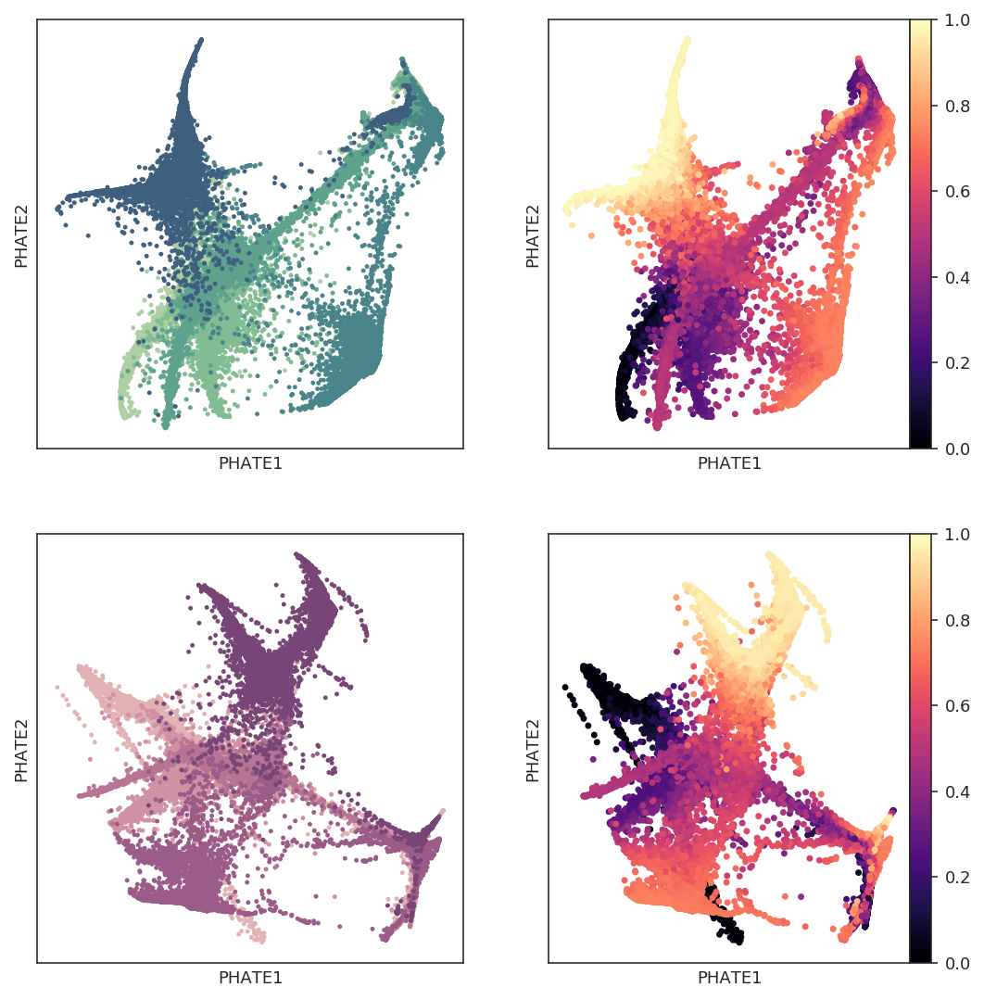

In [7]:
for ctype in ['Granule cell']:#[i for i in adata.obs['ctype'].unique() if 'Granule' not in i]:
    
    tic = time.time()
    
    print('\nStarting group: {}\n'.format(ctype))
    
    recalculate = False
    
    if recalculate:
        wt = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='WT')]
        mut = adata[(adata.obs['ctype']==ctype) & (adata.obs['genotype']=='SCA1')]

        sc.pp.pca(wt)
        sc.pp.neighbors(wt, n_pcs=50)
        sc.pp.pca(mut)
        sc.pp.neighbors(mut, n_pcs=50)
    
    if True:
        wt = utils.adata_phate(wt)
        mut = utils.adata_phate(mut)

    # MELD
    G = gt.Graph(data=wt.obsp['connectivities']+sparse.diags([1]*wt.shape[0],format='csr'),
                 precomputed='adjacency',
                 use_pygsp=True)
    G.knn_max = None
    wt.obs['res_t']=-1
    wt.obs.loc[wt.obs['timepoint']=='12wk', 'res_t'] = -0.5
    wt.obs.loc[wt.obs['timepoint']=='18wk', 'res_t'] = 0
    wt.obs.loc[wt.obs['timepoint']=='24wk', 'res_t'] = 0.5
    wt.obs.loc[wt.obs['timepoint']=='30wk', 'res_t'] = 1
    wt.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=wt.obs['res_t'])
    wt.obs['ees_t'] = (wt.obs['ees_t'] - wt.obs['ees_t'].min()) / (wt.obs['ees_t'].max() - wt.obs['ees_t'].min())
    
    G = gt.Graph(data=mut.obsp['connectivities']+sparse.diags([1]*mut.shape[0],format='csr'),
             precomputed='adjacency',
             use_pygsp=True)
    G.knn_max = None
    mut.obs['res_t']=-1
    mut.obs.loc[mut.obs['timepoint']=='12wk', 'res_t'] = -0.5
    mut.obs.loc[mut.obs['timepoint']=='18wk', 'res_t'] = 0
    mut.obs.loc[mut.obs['timepoint']=='24wk', 'res_t'] = 0.5
    mut.obs.loc[mut.obs['timepoint']=='30wk', 'res_t'] = 1
    mut.obs['ees_t'] = meld.MELD().fit_transform(G=G,RES=mut.obs['res_t'])
    mut.obs['ees_t'] = (mut.obs['ees_t'] - mut.obs['ees_t'].min()) / (mut.obs['ees_t'].max() - mut.obs['ees_t'].min())

    if False:
        # 1d phate
        wt_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(wt.X)
        mut_phate1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(mut.X)

    # plots 
    fig, ax = plt.subplots(2,2, figsize=(9,9))
    sns.scatterplot(
        x=wt.obsm['X_phate'][:,0],
        y=wt.obsm['X_phate'][:,1],
        hue=wt.obs['timepoint'].to_list(),
        palette=cmap_wt,
        ax=ax[0,0],
        linewidth=0,
        s=6,
        rasterized=True)
    ax[0,0].set_xlabel('PHATE1')
    ax[0,0].set_ylabel('PHATE2')
    ax[0,0].set_xticks([])
    ax[0,0].set_yticks([])
    ax[0,0].legend().set_visible(False)
    
    p = ax[0,1].scatter(wt.obsm['X_phate'][:,0],
                        wt.obsm['X_phate'][:,1],
                        c=wt.obs['ees_t'],
                        cmap='magma', s=6,
                        rasterized=True)
    fig.colorbar(p, pad=0, ax=ax[0,1])
    ax[0,1].set_xticks([])
    ax[0,1].set_yticks([])
    ax[0,1].set_xlabel('PHATE1')
    ax[0,1].set_ylabel('PHATE2')
    
    sns.scatterplot(
        x=mut.obsm['X_phate'][:,0],
        y=mut.obsm['X_phate'][:,1],
        hue=mut.obs['timepoint'].to_list(),
        palette=cmap_mut,
        ax=ax[1,0],
        linewidth=0,
        s=6,
        rasterized=True)
    ax[1,0].set_xlabel('PHATE1')
    ax[1,0].set_ylabel('PHATE2')
    ax[1,0].set_xticks([])
    ax[1,0].set_yticks([])
    ax[1,0].legend().set_visible(False)
    
    p = ax[1,1].scatter(mut.obsm['X_phate'][:,0],
                        mut.obsm['X_phate'][:,1],
                        c=mut.obs['ees_t'],
                        cmap='magma', s=6, 
                        rasterized=True)
    fig.colorbar(p, pad=0, ax=ax[1,1])
    ax[1,1].set_xticks([])
    ax[1,1].set_yticks([])
    ax[1,1].set_xlabel('PHATE1')
    ax[1,1].set_ylabel('PHATE2')
    
    if True:
        fig.savefig(os.path.join(pfp, 'pseudotime2d_{}.pdf'.format(ctype)), bbox_inches='tight', dpi=600)
        
    del wt, mut
    
    print('\n... finished {} in {:.2f}-min'.format(ctype, (time.time() - tic)/60))
        
        

# SCA1

Look at one strata indiviually, and plot trajectory 

In [18]:
idata = adata[(adata.obs['ctype']=='Purkinje cell') & (adata.obs['genotype']=='SCA1')]

In [20]:
sc.pp.pca(idata)
sc.pp.neighbors(idata)
if True:
    sc.tl.diffmap(idata)
    pg.fle(idata)
idata = utils.adata_phate(idata)

# MELD
G = gt.Graph(data=idata.uns['neighbors']['connectivities']+sparse.diags([1]*idata.shape[0],format='csr'),
             precomputed='adjacency',
             use_pygsp=True)
G.knn_max = None
idata.obs['res_t']=5
idata.obs.loc[idata.obs['timepoint']=='12wk', 'res_t'] = 12
idata.obs.loc[idata.obs['timepoint']=='18wk', 'res_t'] = 18
idata.obs.loc[idata.obs['timepoint']=='24wk', 'res_t'] = 24
idata.obs.loc[idata.obs['timepoint']=='30wk', 'res_t'] = 30
idata.obs['ees_t']=meld.MELD().fit_transform(G=G,RES=idata.obs['res_t'])
# adata.obs['ees_sca1']=adata.obs['ees_sca1']-adata.obs['ees_sca1'].mean() # mean center

computing PCA
    with n_comps=50
    finished (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9689172  0.9495407  0.92240095 0.9168813  0.907263
     0.8935805  0.8892335  0.8746165  0.86809814 0.85591245 0.8457192
     0.8350997  0.8307286  0.827732  ]
    finished (0:00:00)
/tmp/tmp7k7av8u2.net is written.
['java', '-Djava.awt.headless=true', '-Xmx8g', '-cp', '/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/forceatlas2/ext/forceatlas2.jar:/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/forceatlas2/ext/gephi-toolkit-0.9.2-all.jar', 'kco.forceatlas2.Main', '--input', '/tmp/tmp7k7av8u2.net', '--output', '/tmp/tmp7k7av8u2.coords', '--nthreads', '6', '--seed', '0', '--targetChangePerNode', '2.0', '--targetSteps', '5000', '--2d']
Force-directed layou

/home/ngr4/project/scripts/utils.py:26: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),


  Calculated optimal t in 0.23 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.08 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.62 seconds.
Calculated PHATE in 3.94 seconds.


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  if __name__ == '__main__':


running Leiden clustering
    finished (0:00:00)


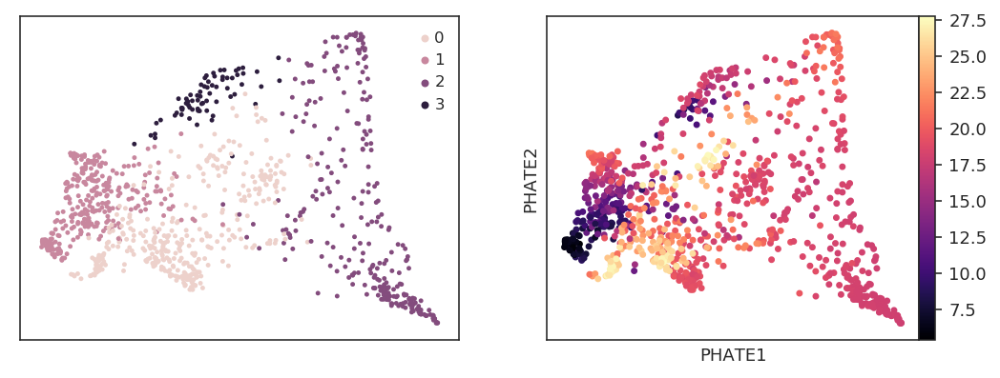

In [21]:
sc.tl.leiden(idata, resolution=0.2)

data_phate = idata.obsm['X_phate']

# viz phate
fig, ax = plt.subplots(1,2, figsize=(9,3))
sns.scatterplot(
    x=data_phate[:,0],
    y=data_phate[:,1],
    hue=idata.obs['leiden'].to_list(),
    ax=ax[0],
    linewidth=0,
    s=6)
ax[0].set_xticks([])
ax[0].set_yticks([])

p = ax[1].scatter(data_phate[:, 0], 
                  data_phate[:, 1], 
                  c=idata.obs['ees_t'],
                  cmap='magma', s=6)
fig.colorbar(p, pad=0, ax=ax[1])
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xlabel('PHATE1')
ax[1].set_ylabel('PHATE2')



# store name
idata.obs['supercluster'] = idata.obs['leiden'].astype(str)

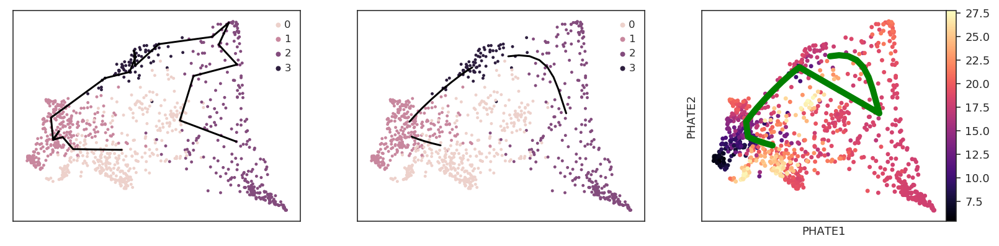

In [22]:
# get centroids of supergroups, calculate distance between them, then get minimum spanning tree from fully connected graph-->could also take average expression in the clusters, then calculate distance in the "data" that way (or even re-project using the transforms from ave. expression data)
centroids = np.zeros((len(idata.obs['supercluster'].unique()), 2))
for cluster in idata.obs['supercluster'].unique():
    # note can always change embedding
    idx = np.where(idata.obs['supercluster']==cluster)[0]
    centroids[int(cluster), :] = np.array([np.mean(data_phate[idx, 0]), np.mean(data_phate[idx, 1])])
adj = squareform(pdist(centroids, metric='cosine'))
minadj = minimum_spanning_tree(adj)

def get_path(Pr, i, j):
    path = [j]
    k = j
    while Pr[i, k] != -9999:
        path.append(Pr[i, k])
        k = Pr[i, k]
    return path[::-1]


# get shortest paths from data 
_, predecessors = shortest_path(idata.obsp['connectivities'], method='auto', directed=False, return_predecessors=True,
              unweighted=False, overwrite=False)

# plot
fig, ax = plt.subplots(1,3, figsize=(14,3))
sns.scatterplot(
    x=data_phate[:,0],
    y=data_phate[:,1],
    hue=idata.obs['supercluster'].to_list(),
    ax=ax[0],
    linewidth=0,
    s=6)
ax[0].set_xticks([])
ax[0].set_yticks([])

sns.scatterplot(
    x=data_phate[:,0],
    y=data_phate[:,1],
    hue=idata.obs['supercluster'].to_list(),
    ax=ax[1],
    linewidth=0,
    s=6)
ax[1].set_xticks([])
ax[1].set_yticks([])

p = ax[2].scatter(data_phate[:, 0], 
                  data_phate[:, 1], 
                  c=idata.obs['ees_t'],
                  cmap='magma', s=6)
fig.colorbar(p, pad=0, ax=ax[2])
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].set_xlabel('PHATE1')
ax[2].set_ylabel('PHATE2')

# plot 'trajectory'
counter = 0
for i in range(minadj.shape[0]):
    J = np.where(np.asarray(minadj[i,:].todense()).flatten() > 0)[0]
    for j in J:
        celli = np.argsort(cdist(data_phate, centroids[i, :].reshape(1,2), metric='euclidean').flatten())[0]
        cellj = np.argsort(cdist(data_phate, centroids[j, :].reshape(1,2), metric='euclidean').flatten())[0]
        geodesic_idx = get_path(predecessors, celli, cellj)
        
        
        # plot 
        ax[0].plot(data_phate[geodesic_idx, 0],
                   data_phate[geodesic_idx, 1],
                   'k-')
        
        # smoothed
        x1 = gaussian_filter1d(
                    data_phate[geodesic_idx, 0],
                    3,
                    axis=-1,
                    order=0,
                    output=None,
                    mode='nearest',
                    cval=0.0,
                    truncate=4.0,
                )
        x2 = gaussian_filter1d(
                    data_phate[geodesic_idx, 1],
                    3,
                    axis=-1,
                    order=0,
                    output=None,
                    mode='nearest',
                    cval=0.0,
                    truncate=4.0,
                )
        
        if counter==0:
            X = x1
            Y = x2
        else:
            X = np.concatenate((X, x1))
            Y = np.concatenate((Y, x2))
        
        counter += 1

        ax[1].plot(x1,
                   x2,
                   'k-')

ax[2].plot(X, Y,
           'g-', lw=5)



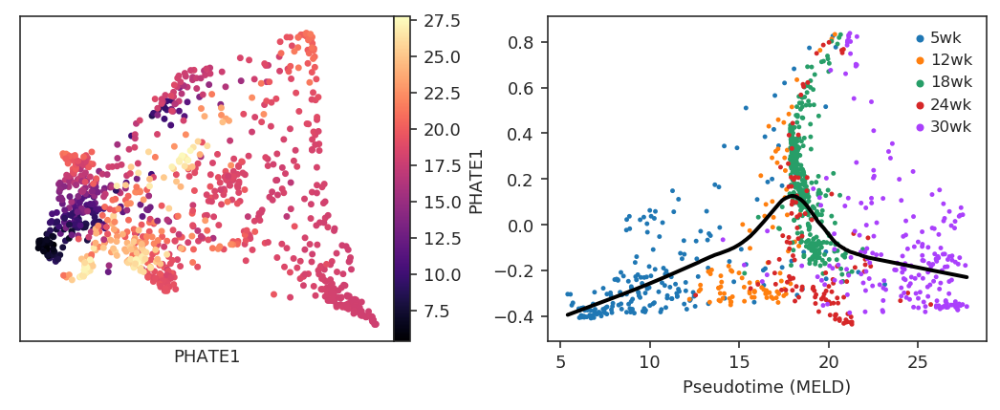

In [25]:
# 1d phate
phate_1d = phate.PHATE(knn=15, gamma=0, n_components=1).fit_transform(idata.X)

# plot 
fig, ax = plt.subplots(1,2, figsize=(9,3))

p = ax[0].scatter(data_phate[:, 0], 
                  data_phate[:, 1], 
                  c=idata.obs['ees_t'],
                  cmap='magma', s=6)
fig.colorbar(p, pad=0, ax=ax[0])
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_xlabel('PHATE1')
ax[1].set_ylabel('PHATE2')

sns.scatterplot(
    x=idata.obs['ees_t'].to_list(),
    y=phate_1d.flatten(),
    hue=idata.obs['timepoint'].to_list(),
    ax=ax[1],
    linewidth=0,
    s=6)
ax[1].set_xlabel('Pseudotime (MELD)')
ax[1].set_ylabel('PHATE1')

z = lowess(phate_1d.flatten(), idata.obs['ees_t'].to_numpy())
ax[1].plot(z[:,0], z[:,1], 'k-', lw=2)

In [14]:
x = np.random.uniform(size=(10,10))

In [15]:
x

array([[0.65497531, 0.52580944, 0.5662926 , 0.64618587, 0.74172264,
        0.50966853, 0.25632104, 0.91006052, 0.21490217, 0.3524298 ],
       [0.49580469, 0.28943252, 0.5931986 , 0.33116587, 0.26632372,
        0.07576338, 0.13669924, 0.26683109, 0.82122279, 0.85934597],
       [0.43050958, 0.72542812, 0.14619029, 0.99481668, 0.42223998,
        0.11891625, 0.74178277, 0.19253974, 0.246199  , 0.46590757],
       [0.98460586, 0.23882163, 0.70424792, 0.44317479, 0.79872916,
        0.49498145, 0.47437764, 0.92790163, 0.99012857, 0.53842705],
       [0.25428514, 0.50413946, 0.83634271, 0.60882859, 0.29467461,
        0.71814929, 0.60078064, 0.66551917, 0.76558832, 0.65728981],
       [0.06472871, 0.07498155, 0.07766056, 0.47754276, 0.20395059,
        0.73111666, 0.78068466, 0.5201705 , 0.90684814, 0.46183071],
       [0.05802876, 0.0194148 , 0.06351413, 0.55243175, 0.3181039 ,
        0.2807304 , 0.66546145, 0.73489537, 0.0391029 , 0.28630808],
       [0.97273386, 0.37135591, 0.9659113

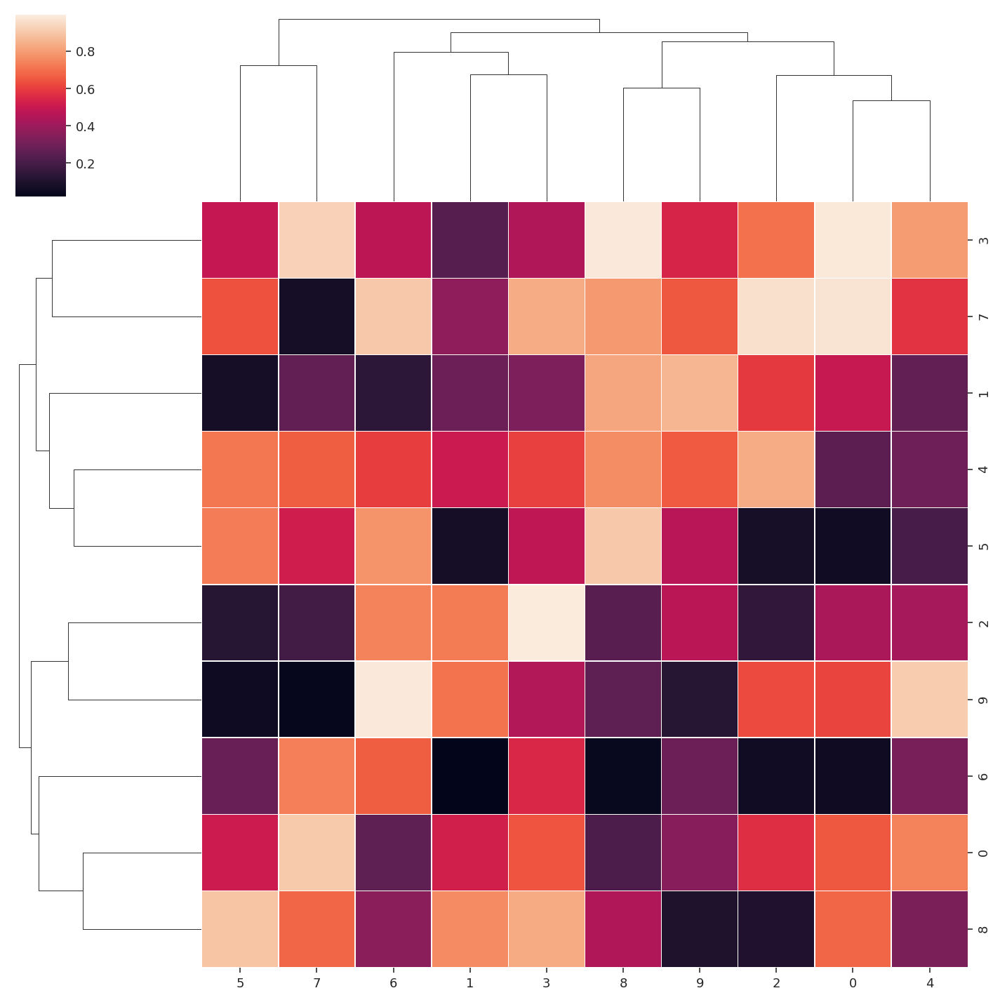

In [20]:
p = sns.clustermap(x, linewidths=0.2)
p.savefig(os.path.join(pfp, 'schematic_heatmap.pdf'), bbox_inches='tight')